Christian Roth und Andreas Waßmus:

# Major Assignment: Used Car Sales Analysis


Kurs: Programming for Data Science

Programmiersprache Python

Angewendete Pakete:

In [118]:
import pandas as pd
import numpy as np

## Beschreibung Use Case

Der Verkauf von Kraftfahrzeugen (PKW) ist in Deutschland ein Markt von großem Interesse. Untergliedert in Neu- und Gebrauchtwagen hat er in 2019 ein Volumen von 191,7 Mrd. EUR. Dabei macht der Verkauf von Gebrauchtwagen mit einem Umsatz von 84,7 Mrd. EUR 44,2% des Marktes aus. Der Gebrauchtwagenmarkt ist zu zwei Dritteln gewerblich und einem Drittel privat organisiert. Ca. 5 Mio. Deutsche überlegen sich in den kommenden Jahren einen neuen Gebrauchtwagen zuzulegen. (Quelle: destatis, abgerufen am 23.08.2019, https://de.statista.com/themen/1377/gebrauchtwagenhandel/)



Folie1.png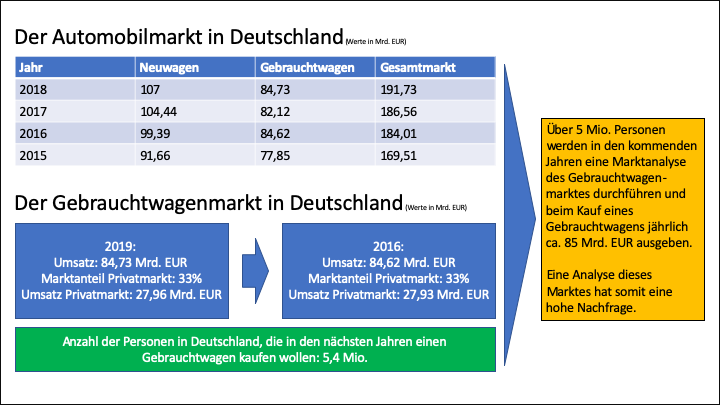


Im vorliegenden Assignment soll eine Analyse des Gebrauchtwagenmarktes in Deutschland durchgeführt werden. Dazu sollen die Verkäufe in diesem Teilsegments näher betrachtet werden. Um Verkaufsdaten zu generieren, wurde überlegt, Plattformen wie mobile.de zu crawlen und die Daten auszuwerten. Ein solcher Crawler hätte den Vorteil einen aktuellen Blick in den Gebrauchtwagenmarkt zu erhalten, ist aber recht umfangreich zu programmieren und hat das Risko, keine Daten zu bekommen, da Marktplätze es über ihre AGB ausschließen und ein Crawling ihrerseits verhindern. Daher wurde das Web nach frei verfügbaren Datensätzen über Gebrauchtwagenverkäufe durchsucht. Es wurde ein __Datensatz in Kaggle aus dem Jahr 2016__ gefunden, der sich sehr gut für diese Analyse nutzen lässt. Ausgehend von einem Privatmarktanteil im Gebrauchtwagenmarkt von 33% weißt das Jahr 2016 mit 27,93 Mrd. EUR zudem eine sehr ähnliche Größe wie das letzte Jahr 2018 aus. Somit ist auch die Aktualität bezogen auf die Marktgröße gegeben.

Im Zuge das Projekts wird der Datensatz mit weiteren Datenpunkten gezielt angereichert, um zusätzliche regionale bzw. geographische Aspekte sowie Unternehmenszugehörigkeiten von Marken darzustellen. Dadurch werden auch die aus den vorangegangenen Assignments abgeleiteten __Anforderungen des Seminars__ abgedeckt.

### Übersicht Daten

__Masterdaten aus Kaggle__

- Used Car Dataset

__CSV-Datensätze__
- Postleitzahlen
- Längen- und Breitengrade
- Einwohner je Postleitzahl
- Bundesländer

__Selbsterstellter CSV Datensatz__

- Automarken und deren Zugehörigkeit zu Automobilkonzernen

__Selbesterstellter Datensatz durch Crawling__

- Logos der Automarken

### Fragestellungen

__Im Rahmen des Assignments kann den folgenden Fragestellen zum privaten Gebrauchtwagenmarkt nachgegangen werden:__ 

- Wie ist das Durchschnittsalter von Gebrauchtwagen?
- Wie ist der durchschnittliche Kilometerstand von Gebrauchtwagen im Privatmarkt?
- Wie ist der durchschnittliche Verkaufspreis der Fahrzeuge im Privatmarkt?
- Wo sind die Preise am teuersten, wo am günstigsten?

(alle Fragen von statista, sind aber kostenpflichtig)

__Weitere mögliche Fragestellungen in Bezug auf die Beschreibung des Marktes:__

- Welche Marktanteile von Marken gibt es im Gebrauchtwagenmarkt?
- Wie sieht die Verteilung der Marktanteile in Bezug auf Automobilkonzerne dar?
- Wo werden bestimmte Marken oder Modelle angeboten?
- Wie stellt sich die Verteilung bei Diesel und Benzinern dar?
- Welche Fahrzeugform haben die angebotenen Autos?
- Wie viel PS haben die angebotenen Autos?
- Wie lange ist eine Anzeige durchschnittlich online, bis das Auto verkauft wird?
- Wie ist der Markt geografisch aufgeteilt? Wo werden besonders viele Autos angeboten bzw. verkauft?

__Fragestellungen zu Angebotsopreisen:__
- Welche Fahrzeuge erzielen höhere Verkaufspreise?
- Welche Marken erzielen die höchsten Preise?
- Welche Merkmale eines Autos haben einen Einfluss auf die Angebotspreise? (Korrelationen)

Aufgrund des Umfangs diese Fragestellungen muss sich im Rahmen des Projekts auf eine Auswahl der Fragen konzentriert werden.

### Vorgehen Analyse

Zunächst werden die CSV-Daten eingelesen und gesichtet. Im Rahmen der anschließenden Datenaufbereitung wird der Datensatz um unbrauchbare Datensätze bereinigt (offensichtliche Falschangaben, offensichtliche Scheinangebote, unrealistische Angebote). Anschließend werden die Markenlogos gecrawlt und ebenfalls in die Analyse integriert. Die Datenaufbereitung findet ihren Abschluss in der Erstellung von zwei für die Analyse zur Verfügung stehenenden Dataframes. Die Datenaufbereitung sollte zudem in einer MongoDB in Azure abgespeichert werden. Aufgrund der langen Übertragungsrate ist der Einbezug dieser Datenbank aber nicht sinnvoll und es wird lediglich die getestete und funktionsfähige Einbindung aufgezeigt.

Im der Analyse werden im ersten Abschnitt Häufigkeiten udn relative Häufigkeiten dargestellt und anschließend auf statistische Merkmale eingegangen. Neben Korreleationen werden auch Marker in einer Deutschlandkarte dargestellt. Das Fazit mit einer Zusammenfassung der wichtigsten Erkenntnisse rundet das Assignment ab.

## Einlesen der Daten


Für die Analyse wird ein Datensatz aus Kaggle verwendet. Diese dort zur Verfügung gestellten Daten wurden im Jahr 2016 mit Scrapy von Ebay-Kleinanzeigen gecrawled. Es handelt sich um 371.528 Datensätze.

Datensatz: https://www.kaggle.com/orgesleka/used-cars-database




### Beschreibung und Einlesen der Masterdaten:

Je Datensatz wurden folgende 19 Datenpunkte gesammelt:

- dateCrawled: Datum, wann die Anzeige das erste mal gecrawlt wurde (alle Feldwerte stammen von diesem Datum, Index)
- name: "Name" des Autos (Anzeigenname)
- seller: Gewerblicher oder privater Verkäufer
- offerType: Handelt es sich um Angebote oder Gesuche
- price : Der Angebotspreis der Anzeige (kein finaler Verkaufspreis) 
- abtest: Ausprägungen "test" und "control" (diese Spalte ist für die Analyse nicht relevant)
- vehicleType: Fahrzeugform, Kategorien von verschiedenen Fahrzeugtypen
- yearOfRegistration: Jahr der Erstzulassug
- gearbox: Getriebeart
- powerPS: Leistung in PS
- model: Modellname des Herstellers
- kilometer: Kilometerstand bei Verkauf
- monthOfRegistration: Monat der Erstzulassung
- fuelType: Kraftstoffart
- brand: Automarke
- notRepairedDamage: Nicht-reparierter Schaden am Auto (Variable lässt keine Aussage über die Höhe der unfallfreien Fahrzeuge zu
- dateCreated: Erstelldatum der Anzeige
- nrOfPictures: Fehlerhafter Spalte wird im Rahmen der Datenbereinigung aus Analyse entfernt
- postalCode: Postleitzahl
- lastSeenOnline: Wann wurde die Anzeige das letzte Mal vom crawler gesehen?






In [119]:
# Initialize relative path of csv-file
relpathCar = "../MajorAssignment/used-cars-database/autos.csv"

# import csv-file into pandas df
df_carData = pd.read_csv(relpathCar, sep=",", encoding="latin-1", index_col=0)

In [120]:
# Einblick in den Datensatz
print(df_carData.shape)
print('----------')
print(df_carData.columns)

(371528, 19)
----------
Index(['name', 'seller', 'offerType', 'price', 'abtest', 'vehicleType',
       'yearOfRegistration', 'gearbox', 'powerPS', 'model', 'kilometer',
       'monthOfRegistration', 'fuelType', 'brand', 'notRepairedDamage',
       'dateCreated', 'nrOfPictures', 'postalCode', 'lastSeen'],
      dtype='object')


### Einbindung zusätzlicher Daten

Der Datensatz wurde dahingehend überprüft, ob es Sinn macht, an bestimmten Stellen Daten anzureichern. Hierzu kommen zwei Spalten in Betracht:
- brand
- postalCode

Zur Marke (brand) der PKWs wird eine CSV-Tabelle mit Konzernzugehörigkeiten der einzelnen Marken eingespielt. Diese CSV wurde selbst erstellt, da keine frei verfügbare Liste oder CSV-Datei gefunden wurde und hier ein Crawling-Prozess in Anbetracht des geringen Informationsgehalts dieser Datei zu aufwendig gewesen wäre. Daher war es effizienter und schneller diese Datei selber zu erstellen.

Bzgl. der Postleitzahlen (postalCode) wurden mehrer Datenbanken durchsucht und verschiedene CSV-Dateien gefunden, sodass zu den Postleitzahlen der Name des Ortes mit Längen- und Breitengraden sowie dessen Einwohnerzahl hinzugefügt werden können. Darüber hinaus können damit die Postleitzahlen einem Bundesland zugeordnet werden. Diese Dateien wurden von http://www.fa-technik.adfc.de/code/opengeodb/PLZ.tab, https://www.suche-postleitzahl.org/downloads und https://excel-karte.de/wp-content/uploads/2016/12/Liste-der-PLZ-in-Excel-Karte-Deutschland-Postleitzahlen.xlsx heruntergeladen (24.08.2019) und werden in diesem Abschnitt ebenfalls mit den Dataframe Used Cars zusammengeführt.

In [121]:
# Initialize relative path of csv-file for other data
relpathKON = "../MajorAssignment/Autokonzerne.csv"
relpathPLZ = "../MajorAssignment/PLZ.csv"
relpathEIN = "../MajorAssignment/plz_einwohner.csv"
relpathBUN = "../MajorAssignment/plz_bundesland.csv"

In [122]:
# Konzernmarken einlesen
df_companies = pd.read_csv(relpathKON, sep=";", encoding="UTF-8")

# Alternative wäre geopy gewesen, aber funktioniert bei sovielen Zeilen wegen HTTP429 To many requests nicht
df_lonlat = pd.read_csv(relpathPLZ, sep='\t', encoding="utf-8")

# Einwohner je PLZ einlesen
df_population = pd.read_csv(relpathEIN, sep=",", encoding="UTF-8")

# Einwohner je PLZ einlesen
df_bundesland = pd.read_csv(relpathBUN, sep=";", encoding="UTF-8")
df_bundesland = df_bundesland.rename(columns={'PLZ': 'plz'})
df_bundesland.head()

,plz,Bundesland,Kreis,Typ
0,1067,Sachsen,Dresden,Stadt
1,1069,Sachsen,Dresden,Stadt
2,1097,Sachsen,Dresden,Stadt
3,1099,Sachsen,Dresden,Stadt
4,1108,Sachsen,Dresden,Stadt


In [123]:
# df_population und df_lonlat und df_bundesland auf Basis von plz zusammenführen
df_postalCodeInfo = df_lonlat.merge(df_population, on='plz', how='left')
df_postalCodeInfo = pd.merge(df_postalCodeInfo, df_bundesland[[
                             'plz', 'Bundesland']], on='plz', how='left')
df_postalCodeInfo.head()

,#loc_id,plz,lon,lat,Ort,einwohner,Bundesland
0,5078,1067,13.721068,51.060034,Dresden,11957.0,Sachsen
1,5079,1069,13.738907,51.039559,Dresden,25491.0,Sachsen
2,5080,1097,13.743967,51.066745,Dresden,14811.0,Sachsen
3,5081,1099,13.828980,51.092619,Dresden,28021.0,Sachsen
4,153646,1108,13.828980,51.092619,Dresden,5876.0,Sachsen


## Data Preparation

In diesem Abschnitt werden die Daten aufbereitet und bereinigt, so dass sie im Anschluss analysiert werden können. 

### Übersicht und Einfinden in die Datensätze

In [124]:
df_carData = df_carData.reset_index()

# Rename postalCode zu plz
df_carData = df_carData.rename(columns={'postalCode': 'plz'})
# df_carData #zur Überprüfung

Die Zeit, die eine Anzeige online ist, gibt Aufschluss darüber, wie groß die Nachfrage nach dem PKW ist und wie gut das Angebot war. Um die Online-Dauer einer Anzeige zu berechnen, wird die Spalte "offerTime" berechnet und hinzugefügt.

__Erstellung eines neuen Attributs:__

Erstellungsdatum der Anzeige - Letztmaliger Anzeigenaufruf möglich = Anzahl der Tage Online

In [127]:
# Column dateCreated & lastSeen in Datetime umwandeln
# dt.normalize() um die Anzeige und nicht dtype selbst zu verändern
df_carData["dateCreated"] = pd.to_datetime(
    df_carData["dateCreated"]).dt.normalize()
df_carData["lastSeen"] = pd.to_datetime(df_carData["lastSeen"]).dt.normalize()

# Added Column offerTime to calculate how long the car was online before it was sold
df_carData["offerTime"] = (df_carData["lastSeen"] -
                           df_carData["dateCreated"]).dt.days

df_carData["dateCrawled"] = pd.to_datetime(df_carData["dateCrawled"]).dt.normalize()

df_carData['year_crawled'], df_carData['month_crawled'] = df_carData['dateCrawled'].dt.year, df_carData['dateCrawled'].dt.month


                            # Check dtypes, ob Umwandlung erfolgreich.
# df_carData.dtypes
df_carData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 371528 entries, 0 to 371527
Data columns (total 25 columns):
dateCrawled            371528 non-null datetime64[ns]
name                   371528 non-null object
seller                 371528 non-null object
offerType              371528 non-null object
price                  371528 non-null int64
abtest                 371528 non-null object
vehicleType            333659 non-null object
yearOfRegistration     371528 non-null int64
gearbox                351319 non-null object
powerPS                371528 non-null int64
model                  351044 non-null object
kilometer              371528 non-null int64
monthOfRegistration    371528 non-null int64
fuelType               338142 non-null object
brand                  371528 non-null object
notRepairedDamage      299468 non-null object
dateCreated            371528 non-null datetime64[ns]
nrOfPictures           371528 non-null int64
plz                    371528 non-null int64
lastSe

In [128]:
# Kontrolle df nach Integration Attribut "offerTime"
df_carData.head(5)

,dateCrawled,name,seller,offerType,price,abtest,vehicleType,yearOfRegistration,gearbox,powerPS,...,notRepairedDamage,dateCreated,nrOfPictures,plz,lastSeen,offerTime,year,month,year_crawled,month_crawled
0,2016-03-24,Golf_3_1.6,privat,Angebot,480,test,NaN,1993,manuell,0,...,NaN,2016-03-24,0,70435,2016-04-07,14,2016,3,2016,3
1,2016-03-24,A5_Sportback_2.7_Tdi,privat,Angebot,18300,test,coupe,2011,manuell,190,...,ja,2016-03-24,0,66954,2016-04-07,14,2016,3,2016,3
2,2016-03-14,"Jeep_Grand_Cherokee_""Overland""",privat,Angebot,9800,test,suv,2004,automatik,163,...,NaN,2016-03-14,0,90480,2016-04-05,22,2016,3,2016,3
3,2016-03-17,GOLF_4_1_4__3TÜRER,privat,Angebot,1500,test,kleinwagen,2001,manuell,75,...,nein,2016-03-17,0,91074,2016-03-17,0,2016,3,2016,3
4,2016-03-31,Skoda_Fabia_1.4_TDI_PD_Classic,privat,Angebot,3600,test,kleinwagen,2008,manuell,69,...,nein,2016-03-31,0,60437,2016-04-06,6,2016,3,2016,3


### Umgang mit fehlenden und nicht benötigten Werten:

#### Fehlende Werte:

Grundsätzlich gibt es drei Möglichkeiten, mit den fehlenden Werten umzugehen: 

- 1. Wir löschen alle unvollständigen Datensätze.
- 2. Wir belassen die unvollständigen Datensätze im Dataset und verwenden für bestimmte Analyse nur die vollständigen Datensätze.
- 3. Wir ersetzen die fehlenden Werte.

Für die hier durchgeführte deskriptive Analyse reicht es zunächst aus, __die fehlenden Werte (NaN values) im Datensatz zu belassen__. Zur eindeutigen Kennzeichnung werden diese mit einen (-) ersetzt (alle String-Datentypen). Wir gehen somit mit __Option 2__ vor und werden, falls notwendig, für bestimmte deskriptive Analysen (bspw. Korrelationen) nur vollständige Datensätze zulassen. Für tiefergehende Analysen ist zu prüfen, inwieweit diese Werte ersetzt werden können oder ob man mit Option 1 verfahren muss.

Insgeamt gibt es 5 Spalten mit fehlenden Werten:

In [129]:
# Check NaN values
df_carData.isna().sum()

dateCrawled            0    
name                   0    
seller                 0    
offerType              0    
price                  0    
abtest                 0    
vehicleType            37869
yearOfRegistration     0    
gearbox                20209
powerPS                0    
model                  20484
kilometer              0    
monthOfRegistration    0    
fuelType               33386
brand                  0    
notRepairedDamage      72060
dateCreated            0    
nrOfPictures           0    
plz                    0    
lastSeen               0    
offerTime              0    
year                   0    
month                  0    
year_crawled           0    
month_crawled          0    
dtype: int64

NaN-Werte werden mit "-" ersetzt. Neben diesen Werten gibt es beim Attribut "monthOfRegistration" den Wert 0 als fehlenden Wert oder keine Angabe. Dieser Wert wird nicht mit "-" ersetzt, da es ein numerisches Feld ist und ansonsten das Attribut nicht für weitere Kalkulationen benutzt werden kann. Im weiteren Verlauf wird so auch mit den Floating Variablen verfahren und die NaN Values bei Längen- und Breitengraden im Datensatz belassen, damit diese in Berechnungen einbezogen werden können.

In [130]:
# Fill missing values with "-"
df_carData = df_carData.fillna("-")
# df_carData.head()

Überprüfung ob alle fehlenden Werte ersetzt wurden:

In [131]:
df_carData.isna().sum()

dateCrawled            0
name                   0
seller                 0
offerType              0
price                  0
abtest                 0
vehicleType            0
yearOfRegistration     0
gearbox                0
powerPS                0
model                  0
kilometer              0
monthOfRegistration    0
fuelType               0
brand                  0
notRepairedDamage      0
dateCreated            0
nrOfPictures           0
plz                    0
lastSeen               0
offerTime              0
year                   0
month                  0
year_crawled           0
month_crawled          0
dtype: int64

#### Nicht benötigte Attribute

Im nächsten Schritt wird der Datensatz um Gesuche (Attribut "offerType") bereinigt, sodass nur Angebote im Datensatz vorhanden sind. Dadurch verliert das Attribut "offerType" seine Daseinsberechtigung und kann gelöscht werden. Ebenso wird mit dem Attribut "seller" verfahren. Zusätzlich werden die Spalten "nrOfPictures" (Fehler beim Crawlen dokumentiert in Kaggle) und "abtest" gelöscht, da diese Spalten keinen Mehrwert für die nachfolgenden Analysen generieren und somit ebenfalls nicht benötigt werden.

In [132]:
# Ausprägungen der Spalte anzeigen lassen: 12 Gesuche sind zu entfernen
df_carData["offerType"].value_counts()

Angebot    371516
Gesuch     12    
Name: offerType, dtype: int64

In [133]:
# 12 Gesuche löschen -> 371516 Angebote...
df_carData = df_carData[df_carData.offerType != "Gesuch"]

Bereinigung des Datensatzes um gewerbliche Anbieter aufgrund von Fokus der Analyse:

In [134]:
# Ausprägungen einer Spalte anzeigen lassen
df_carData["seller"].value_counts()

privat        371513
gewerblich    3     
Name: seller, dtype: int64

In [135]:
# 3 gewerbliche Angebote löschen -> 371513 Angebote nur von Privatpersonen
df_carData = df_carData[df_carData.seller != "gewerblich"]

In [136]:
# Löschen der zuvor genannten Spalten - delete the columns without having to reassign (inplace)
df_carData.drop(['nrOfPictures', 'seller', 'offerType',
                 'abtest'], axis=1, inplace=True)

In [137]:
print(df_carData.shape)

(371513, 21)


Der Datensatz wurde somit auf 371513 Datensätze mit 16 Attributen reduziert.

Bei der Sichtung der Daten ist auffällig, dass __viele PKW zum Preis 0__ EUR angeboten werden und bei den angeboten weiterhin Begriffe wie Suche, Ankauf, Tausch, Schenkung, u.w. auftauchen. Schaut man sich dies genauer ist, so ist das zu einem großen Anteil mit dem __Preis 0-100__ EUR verbunden. __Daher werden zunächst alle Datensätze mit dem Preis <100 EUR gelöscht__. Das Gleiche ist am anderen Ende der Preise zu beobachten, sodass eine große Anzahl nicht ernstgemeinter oder unserioser Angebote in großen Höhen zu beobachten ist. __Daher werden ebenfalls alle Angebote mit Preisen >500.000 EUR gelöscht__. Anschließend wird der Datensatz gezielt nach __Suchbegriffen__, die eindeutig auf kein hier zu verwendentes Angebot verweisen, gefiltert und bereinigt:

In [138]:
# Preise <100 EUR löschen -> 358199 Angebote...
df_carData = df_carData[df_carData.price >= 100]

# Preise >500.000 EUR löschen -> 351858 Angebote...
df_carData = df_carData[df_carData.price < 500000]

In [139]:
df_carData

,dateCrawled,name,price,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,...,brand,notRepairedDamage,dateCreated,plz,lastSeen,offerTime,year,month,year_crawled,month_crawled
0,2016-03-24,Golf_3_1.6,480,-,1993,manuell,0,golf,150000,0,...,volkswagen,-,2016-03-24,70435,2016-04-07,14,2016,3,2016,3
1,2016-03-24,A5_Sportback_2.7_Tdi,18300,coupe,2011,manuell,190,-,125000,5,...,audi,ja,2016-03-24,66954,2016-04-07,14,2016,3,2016,3
2,2016-03-14,"Jeep_Grand_Cherokee_""Overland""",9800,suv,2004,automatik,163,grand,125000,8,...,jeep,-,2016-03-14,90480,2016-04-05,22,2016,3,2016,3
3,2016-03-17,GOLF_4_1_4__3TÜRER,1500,kleinwagen,2001,manuell,75,golf,150000,6,...,volkswagen,nein,2016-03-17,91074,2016-03-17,0,2016,3,2016,3
4,2016-03-31,Skoda_Fabia_1.4_TDI_PD_Classic,3600,kleinwagen,2008,manuell,69,fabia,90000,7,...,skoda,nein,2016-03-31,60437,2016-04-06,6,2016,3,2016,3
5,2016-04-04,BMW_316i___e36_Limousine___Bastlerfahrzeug__Export,650,limousine,1995,manuell,102,3er,150000,10,...,bmw,ja,2016-04-04,33775,2016-04-06,2,2016,4,2016,4
6,2016-04-01,Peugeot_206_CC_110_Platinum,2200,cabrio,2004,manuell,109,2_reihe,150000,8,...,peugeot,nein,2016-04-01,67112,2016-04-05,4,2016,4,2016,4
8,2016-04-04,Ford_C___Max_Titanium_1_0_L_EcoBoost,14500,bus,2014,manuell,125,c_max,30000,8,...,ford,-,2016-04-04,94505,2016-04-04,0,2016,4,2016,4
9,2016-03-17,VW_Golf_4_5_tuerig_zu_verkaufen_mit_Anhaengerkupplung,999,kleinwagen,1998,manuell,101,golf,150000,0,...,volkswagen,-,2016-03-17,27472,2016-03-31,14,2016,3,2016,3
10,2016-03-26,Mazda_3_1.6_Sport,2000,limousine,2004,manuell,105,3_reihe,150000,12,...,mazda,nein,2016-03-26,96224,2016-04-06,11,2016,3,2016,3


In [140]:
# Spalte name in lowercase
df_carData = df_carData.apply(
    lambda x: x.str.lower() if(x.dtype == 'object') else x)

# Datensätze löschen, welche die nachfolgenden Begriffe enthalten ->351926 Angebote...
df_carData = df_carData[~df_carData.name.str.contains("such")]
df_carData = df_carData[~df_carData.name.str.contains("ankauf")]
df_carData = df_carData[~df_carData.name.str.contains("tausch")]
df_carData = df_carData[~df_carData.name.str.contains("abholung")]
df_carData = df_carData[~df_carData.name.str.contains("schlacht")]
df_carData = df_carData[~df_carData.name.str.contains("schenk")]

In [141]:
df_carData["name"].value_counts().head(10)

opel_corsa             777
ford_fiesta            745
bmw_318i               629
volkswagen_golf_1.4    605
renault_twingo         560
bmw_316i               525
bmw_320i               493
volkswagen_polo        490
opel_corsa_b           484
ford_focus             438
Name: name, dtype: int64

In [142]:
# Test, ob Lösung vollzogen
df_carData.loc[df_carData['name'] == "tausch"]

,dateCrawled,name,price,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,...,brand,notRepairedDamage,dateCreated,plz,lastSeen,offerTime,year,month,year_crawled,month_crawled


In [143]:
print(df_carData.shape)

(351858, 21)


### Einbinden von Geodaten Autokonzerne und Markenlogos

Zunächst wird die Spalte "postalCode" aus dem carData Dataframe extrahiert und in ein neues Dataframe geschrieben. 

In [144]:
#Create df with unique postalCode values from carData
df_carData_postalCode = pd.DataFrame(df_carData['plz'].unique(),  columns=['plz']) 
df_carData_postalCode.head()

,plz
0,70435
1,66954
2,90480
3,91074
4,60437


Im Anschluss daran wird das anfangs eingelesene Dataframe "df_postalCodeInfo" mit dem soeben erstellen Dataframe zusammengeführt und bei Einwohnern die Nachkommastellen entfernt. 

In [145]:
df_locationData = df_carData_postalCode.merge(df_postalCodeInfo, on='plz')

In [146]:
print(df_locationData.head())
print("--------")
print(df_locationData.shape)

     plz  #loc_id        lon        lat                Ort  einwohner  \
0  70435  9703     9.159157   48.830653  Stuttgart          206.0       
1  66954  9414     7.564295   49.202121  Pirmasens          10417.0     
2  90480  11724    11.132551  49.447293  Nürnberg           18393.0     
3  91074  11774    10.878277  49.572095  Herzogenaurach     22222.0     
4  60437  9033     8.678966   50.199217  Frankfurt am Main  3123.0      

          Bundesland  
0  Baden-Württemberg  
1  Rheinland-Pfalz    
2  Bayern             
3  Bayern             
4  Hessen             
--------
(8126, 7)


In [147]:
df_locationData.style.format({
    'einwohner': '{:.0f}'.format
})

#Change Column 'einwohner' to int-type
#df_locationData.einwohner.astype(int)
#df_locationData.head()

,plz,#loc_id,lon,lat,Ort,einwohner,Bundesland
0,70435,9703,9.15916,48.8307,Stuttgart,206,Baden-Württemberg
1,66954,9414,7.5643,49.2021,Pirmasens,10417,Rheinland-Pfalz
2,90480,11724,11.1326,49.4473,Nürnberg,18393,Bayern
3,91074,11774,10.8783,49.5721,Herzogenaurach,22222,Bayern
4,60437,9033,8.67897,50.1992,Frankfurt am Main,3123,Hessen
5,33775,7225,8.17036,52.0402,Versmold,21005,Nordrhein-Westfalen
6,67112,9435,8.35045,49.4416,Mutterstadt,12411,Rheinland-Pfalz
7,94505,12258,12.9049,48.912,Bernried,4779,Bayern
8,27472,6780,8.70959,53.8544,Cuxhaven,12415,Niedersachsen
9,96224,12460,11.2903,50.1468,Burgkunstadt,6624,Bayern


Abschließend werden für dieses DF ebenfalls die NaN-Werte geprüft und ggf. gelöscht.

In [148]:
df_locationData.head()

,plz,#loc_id,lon,lat,Ort,einwohner,Bundesland
0,70435,9703,9.159157,48.830653,Stuttgart,206.0,Baden-Württemberg
1,66954,9414,7.564295,49.202121,Pirmasens,10417.0,Rheinland-Pfalz
2,90480,11724,11.132551,49.447293,Nürnberg,18393.0,Bayern
3,91074,11774,10.878277,49.572095,Herzogenaurach,22222.0,Bayern
4,60437,9033,8.678966,50.199217,Frankfurt am Main,3123.0,Hessen


In [149]:
#Check missing values 
df_locationData.isna().sum()

plz           0 
#loc_id       0 
lon           0 
lat           0 
Ort           0 
einwohner     66
Bundesland    34
dtype: int64

In [150]:
df_locationData = df_locationData[pd.notnull(df_locationData['einwohner'])]

In [151]:
print(df_locationData.shape)
print("-------------")
print(df_locationData.isna().sum())

(8060, 7)
-------------
plz           0
#loc_id       0
lon           0
lat           0
Ort           0
einwohner     0
Bundesland    0
dtype: int64


### Erstellung von analysefähigen Dataframes

Bei der Sichtung der Daten ist ebenfalls aufgefallen, dass es sich bei vorliegendem Analyse bei Ebay Kleinanzeigen um einen sehr heterogenen Markt handelt, in dem Privatpersonen so ziemlich alles rund um das Auto anbieten. Neben Scheinangeboten und Angeboten, bei denen es sich nicht um einen zu verkaufenden PKW handelt, gibt es auch Nonsens-Angebote, da auf dieser Plattform scheinbar keine Prüfprozesse der Angebote stattfinden (es kann jeder schreiben, was er will). Für eine statistische Analyse muss die Reliabilität der Daten erhöht werden und die wahren Angebote von dem Rest getrennt werden. Da die Kontrolle jedes einzelnen Datensatzes zu aufwendig wäre, werden in diesem Assignment analysefähige Dataframes erstellt, bei denen Bereiche abgesteckt werden, in denen eine hohe Zahl an wahren Angeboten zu finden ist. 

Zu diesem Zweck werden zunächst alle Angebote vor 1945 gelöscht. Hierbei handelt es sich lediglich um 138 Deatensätze, die zum Teil nicht seriös erscheinen. Für eine Oldtimeranalyse steht daher der Zeitraum 1945-1985 zur Verfügung.

Der aktuelle Fokus von Käufern im Gebrauchtwagenmarkt dürfte aber auf normalen PKW (keine H-Kennzeichen) liegen. Ausgehend vom Analysedatum 2016 liegt der Markt für solche Fahrzeuge zwischen 1986 und 2015. Das Jahr 2016 wird in der Analyse ausgeklammert, da die Sichtung dieser Daten ergab, dass mit dieser Jahreszahl Autos angeboten werden, die deutlich älter sind, bspw. mit mehr als 30.000 Kilometer. Somit scheint das aktuelle Datum des Angebots in vielen Fällen von Verkäufern genutzt zu werden, um Aufmerksamkeit zu erregen und nicht eine wahre Angabe zu machen.

Im nun Folgenden werden __drei DFs__ programmiert. Zunächst werden im df_allCars die Attribute der anderen Datensätze ergänzt und anschließend ein Datensatz für Oldtimer und einer für normale PKW gebildet.  

In [152]:
# Select Cars with yearOfRegistration between 1945 and 2016
df_allCars = df_carData[(df_carData.yearOfRegistration >= 1945) &
                        (df_carData.yearOfRegistration <= 2015)]

#### Verbindung des df_allCars mit df_locationData und df_companies 

In diesem Abschnitt werden die erzeugten DFs "zusätzliche Daten" zusammengeführt und ein DF mit allen Attributen erzeugt. Zunächst werden die Verkäufe mit der locationData verbunden. Anschließend werden auch die Konzerne eingespielt.

###### Merge mit df_locationData:

In [153]:
# Überprüfung ob alle plz in beiden Datensätzen vorhandeln sind
df_allCars['plz'].isin(df_locationData['plz']).value_counts()

True     329081
False    481   
Name: plz, dtype: int64

In [154]:
# Welche Postleitzahlen sind unterschiedlich?
# set(df_allCars.plz).difference(set(df_locationData.plz))

In [155]:
df_allCarsLocation = pd.merge(
    df_allCars, df_locationData, on='plz', how='left')
df_allCarsLocation.head()

,dateCrawled,name,price,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,...,year,month,year_crawled,month_crawled,#loc_id,lon,lat,Ort,einwohner,Bundesland
0,2016-03-24,golf_3_1.6,480,-,1993,manuell,0,golf,150000,0,...,2016,3,2016,3,9703.0,9.159157,48.830653,Stuttgart,206.0,Baden-Württemberg
1,2016-03-24,a5_sportback_2.7_tdi,18300,coupe,2011,manuell,190,-,125000,5,...,2016,3,2016,3,9414.0,7.564295,49.202121,Pirmasens,10417.0,Rheinland-Pfalz
2,2016-03-14,"jeep_grand_cherokee_""overland""",9800,suv,2004,automatik,163,grand,125000,8,...,2016,3,2016,3,11724.0,11.132551,49.447293,Nürnberg,18393.0,Bayern
3,2016-03-17,golf_4_1_4__3türer,1500,kleinwagen,2001,manuell,75,golf,150000,6,...,2016,3,2016,3,11774.0,10.878277,49.572095,Herzogenaurach,22222.0,Bayern
4,2016-03-31,skoda_fabia_1.4_tdi_pd_classic,3600,kleinwagen,2008,manuell,69,fabia,90000,7,...,2016,3,2016,3,9033.0,8.678966,50.199217,Frankfurt am Main,3123.0,Hessen


#### Einbindung der Markenlogos

In [156]:
# pip install beautifulsoup4 if it is not already in your environment
from bs4 import BeautifulSoup
import requests
import glob
import random
import base64

from PIL import Image
from io import BytesIO
from IPython.display import Image, HTML

In [157]:
companies_url = "http://www.auto-motor-und-sport.de/Marken-modelle/"
r = requests.get(companies_url)

In [158]:
relIMG = "../MajorAssignment/company-images/"
soupAddress=BeautifulSoup(r.text,"html.parser")
images = soupAddress.findAll('img', alt=True)
df_companies['image_url'] = ''

for image in images:
    print('image alt: ' + image['alt'])
    print('image src: ' + image['src'])

    companyName = image['alt'].lower().split(' ', 1)[0]
    logo_url = image['src']
    
    print('companyName: ' + companyName)
    print('logo_url: ' + logo_url)
    print(companyName)
    print('-----------------')
    
    if companyName != '':
        df_companies['image_url'] = np.where(df_companies['brand'].str.contains(companyName), logo_url, df_companies['image_url'],)
    

image alt: 
image src: https://imgr1.auto-motor-und-sport.de/AMS-Heft-2019-Ausgabe-20-magazineOverviewAsv-4a7e4d10-1627709.jpg
companyName: 
logo_url: https://imgr1.auto-motor-und-sport.de/AMS-Heft-2019-Ausgabe-20-magazineOverviewAsv-4a7e4d10-1627709.jpg

-----------------
image alt: 
image src: https://imgr1.auto-motor-und-sport.de/image-magazineOverviewAsv-4ea934f9-1621416.jpg
companyName: 
logo_url: https://imgr1.auto-motor-und-sport.de/image-magazineOverviewAsv-4ea934f9-1621416.jpg

-----------------
image alt: 
image src: https://imgr1.auto-motor-und-sport.de/image-magazineOverviewAsv-53c635b7-1621487.jpg
companyName: 
logo_url: https://imgr1.auto-motor-und-sport.de/image-magazineOverviewAsv-53c635b7-1621487.jpg

-----------------
image alt: 
image src: https://imgr1.auto-motor-und-sport.de/image-magazineOverviewAsv-b919980d-1621417.jpg
companyName: 
logo_url: https://imgr1.auto-motor-und-sport.de/image-magazineOverviewAsv-b919980d-1621417.jpg

-----------------
image alt: 
image 

In [159]:
df_companies.head()

,company,brand,image_url
0,VW-Konzern,volkswagen,https://imgr1.auto-motor-und-sport.de/Volkswagen-Logo-brandtreeIndexSmall-f4ae98d2-941118.jpg
1,VW-Konzern,audi,https://imgr1.auto-motor-und-sport.de/Audi-Logo-Neu-02-2019-brandtreeIndexSmall-44d434cb-1430808.jpg
2,VW-Konzern,bentley,https://imgr1.auto-motor-und-sport.de/Bentley-Logo-brandtreeIndexSmall-41a61902-702423.jpg
3,VW-Konzern,bugatti,https://imgr1.auto-motor-und-sport.de/Bugatti-Logo-brandtreeIndexSmall-252888c-946200.jpg
4,VW-Konzern,lamborghini,https://imgr1.auto-motor-und-sport.de/Lamborghini-Logo-brandtreeIndexSmall-df88a8a3-945695.jpg


In [160]:
from IPython.display import Image, HTML

df_companies['image_url'] = df_companies['image_url']\
    .str.replace(
        '(.*)',
        '<img src="\\1" style="max-height:124px;"></img>'
)
with pd.option_context('display.max_colwidth', 10000):
    HTML(df_companies.to_html(escape=False))

In [161]:
#Quelle: https://stackoverflow.com/questions/46107348/how-to-display-image-stored-in-pandas-dataframe
pd.set_option('display.max_colwidth', -1)


def get_thumbnail(path):
    i = Image.open(path)
    i.thumbnail((150, 150), Image.LANCZOS)
    return i


def image_base64(im):
    if isinstance(im, str):
        im = get_thumbnail(im)
    with BytesIO() as buffer:
        im.save(buffer, 'jpeg')
        return base64.b64encode(buffer.getvalue()).decode()


def image_formatter(im):
    return f'<img src="data:image/jpeg;base64,{image_base64(im)}">'

In [162]:
HTML(df_companies.to_html(formatters={'image': image_formatter}, escape=False))

,company,brand,image_url
0,VW-Konzern,volkswagen,
1,VW-Konzern,audi,
2,VW-Konzern,bentley,
3,VW-Konzern,bugatti,
4,VW-Konzern,lamborghini,
5,VW-Konzern,porsche,
6,VW-Konzern,seat,
7,VW-Konzern,skoda,
8,Fiat-Chrysler-Konzern,fiat,
9,Fiat-Chrysler-Konzern,chrysler,


Überprüfen ob die eingelesenen Konzernnamen auch mit den Konzernnamen im carData Datensatz übereinstimmen:

In [163]:
df_allCarsLocation['brand'].isin(df_companies['brand']).value_counts()

True     326773
False    2789  
Name: brand, dtype: int64

In [164]:
# 2833 Datensätze können nicht zusammengeführt werden. Um welche Datensätze handelt es sich?
set(df_allCarsLocation.brand).difference(set(df_companies.brand))

{'sonstige_autos'}

In [165]:
df_usedCarsAnalysis = pd.merge(
    df_allCarsLocation, df_companies, on='brand', how='left')
df_usedCarsAnalysis.head()

,dateCrawled,name,price,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,...,year_crawled,month_crawled,#loc_id,lon,lat,Ort,einwohner,Bundesland,company,image_url
0,2016-03-24,golf_3_1.6,480,-,1993,manuell,0,golf,150000,0,...,2016,3,9703.0,9.159157,48.830653,Stuttgart,206.0,Baden-Württemberg,VW-Konzern,"<img src=""https://imgr1.auto-motor-und-sport.de/Volkswagen-Logo-brandtreeIndexSmall-f4ae98d2-941118.jpg"" style=""max-height:124px;""></img><img src="""" style=""max-height:124px;""></img>"
1,2016-03-24,a5_sportback_2.7_tdi,18300,coupe,2011,manuell,190,-,125000,5,...,2016,3,9414.0,7.564295,49.202121,Pirmasens,10417.0,Rheinland-Pfalz,VW-Konzern,"<img src=""https://imgr1.auto-motor-und-sport.de/Audi-Logo-Neu-02-2019-brandtreeIndexSmall-44d434cb-1430808.jpg"" style=""max-height:124px;""></img><img src="""" style=""max-height:124px;""></img>"
2,2016-03-14,"jeep_grand_cherokee_""overland""",9800,suv,2004,automatik,163,grand,125000,8,...,2016,3,11724.0,11.132551,49.447293,Nürnberg,18393.0,Bayern,Fiat-Chrysler-Konzern,"<img src=""https://imgr1.auto-motor-und-sport.de/Jeep-Logo-brandtreeIndexSmall-2181a802-941106.jpg"" style=""max-height:124px;""></img><img src="""" style=""max-height:124px;""></img>"
3,2016-03-17,golf_4_1_4__3türer,1500,kleinwagen,2001,manuell,75,golf,150000,6,...,2016,3,11774.0,10.878277,49.572095,Herzogenaurach,22222.0,Bayern,VW-Konzern,"<img src=""https://imgr1.auto-motor-und-sport.de/Volkswagen-Logo-brandtreeIndexSmall-f4ae98d2-941118.jpg"" style=""max-height:124px;""></img><img src="""" style=""max-height:124px;""></img>"
4,2016-03-31,skoda_fabia_1.4_tdi_pd_classic,3600,kleinwagen,2008,manuell,69,fabia,90000,7,...,2016,3,9033.0,8.678966,50.199217,Frankfurt am Main,3123.0,Hessen,VW-Konzern,"<img src=""https://imgr1.auto-motor-und-sport.de/Skoda-Logo-brandtreeIndexSmall-e7930242-941116.jpg"" style=""max-height:124px;""></img><img src="""" style=""max-height:124px;""></img>"


In [166]:
# NaN-Werte lokalisieren
df_usedCarsAnalysis.isna().sum()

dateCrawled            0   
name                   0   
price                  0   
vehicleType            0   
yearOfRegistration     0   
gearbox                0   
powerPS                0   
model                  0   
kilometer              0   
monthOfRegistration    0   
fuelType               0   
brand                  0   
notRepairedDamage      0   
dateCreated            0   
plz                    0   
lastSeen               0   
offerTime              0   
year                   0   
month                  0   
year_crawled           0   
month_crawled          0   
#loc_id                483 
lon                    483 
lat                    483 
Ort                    483 
einwohner              483 
Bundesland             483 
company                2789
image_url              2789
dtype: int64

In [167]:
#Droppe die Datensätze für die keine Location Daten verfügbar sind
df_usedCarsAnalysis.dropna(subset=['Ort'], inplace=True)

#### Dataframe oltimerCars und normalCars

Nachstehend werden noch die zwei ausstehenden DFs programmiert: 

In [168]:
# Select Cars with yearOfRegistration between 1945 and 1986
df_oldtimerCars = df_usedCarsAnalysis[(df_usedCarsAnalysis.yearOfRegistration >= 1945) & (
    df_usedCarsAnalysis.yearOfRegistration < 1986)]
# df_oldtimerCars.head()
# df_oldtimerCars['yearOfRegistration'].value_counts()

In [169]:
# Select Cars with yearOfRegistration between 1986 and 2015
df_normalCars = df_usedCarsAnalysis[(df_usedCarsAnalysis.yearOfRegistration >= 1986) & (
    df_usedCarsAnalysis.yearOfRegistration <= 2015)]
# df_oldtimerCars.head()

### Exkurs Database

Zur Einbindung eine Datenbank wurde an dieser Stelle überlegt, die Dataframes in eine MongoDB einzubinden oder diese in eine Azure-Cloud-Umgebung zu legen. Dazu wurden die nachfolgende Programmierung vorgenommen und die Einbindung einer solchen Database erfolgreich getestet. Wir können somit einen __erfolgreichen PoC__ aufzeigen.

Beim Laden der Daten wurde allerdings festgestellt, dass im Rahmen diese Aufgabe ein Transfer in Azure zu langsam und somit zeitaufwendig ist. Das rechnen von lokal gespeicherten Dataframes ist viel schneller und effizienter. Mit diesem Abschnitt soll daher eine solche Möglichkeit aufgezeigt werden.


In [49]:
import pyodbc
server = 'datascience-assignment.database.windows.net'
database = 'datascience-db'
username = 'datascience-admin'
password = 'Assignment5'
driver = '{ODBC Driver 17 for SQL Server}'
cnxn = pyodbc.connect('DRIVER='+driver+';SERVER='+server +
                      ';PORT=1433;DATABASE='+database+';UID='+username+';PWD=' + password)
cursor = cnxn.cursor()
cursor.execute("SELECT @@version;")
row = cursor.fetchone()
while row:
    print(row[0])
    row = cursor.fetchone()

Microsoft SQL Azure (RTM) - 12.0.2000.8 
	Aug 23 2019 18:35:02 
	Copyright (C) 2019 Microsoft Corporation



In [50]:
from sqlalchemy import create_engine
import urllib
import pyodbc
import pandas as pd

quoted = urllib.parse.quote_plus(
    r"Driver={ODBC Driver 17 for SQL Server};Server=tcp:datascience-assignment.database.windows.net,1433;Database=datascience-db;Uid=datascience-admin@datascience-assignment;Pwd=Assignment5;Encrypt=yes;TrustServerCertificate=no;Connection Timeout=30;")
engine = create_engine('mssql+pyodbc:///?odbc_connect={}'.format(quoted))

In [51]:
engine.echo

In [52]:
# Reset index, for inserting into Azure SQL database
t_offer = df_allCars.reset_index()

In [53]:
#Insert df_allCars into Azure database
if not engine.has_table("t_company"):
    df_companies.to_sql(name='t_company',
                     index_label='index', con=engine, index=False)
    print('Table created')
else:
    print("table already exists")

table already exists


In [54]:
#Insert df_locationData into Azure database
if not engine.has_table("t_location"):
    df_locationData.to_sql(name='t_location', 
                      index_label='index', con=engine, index=False)
    print('Table created')
else:
    print("table already exists")

table already exists


In [55]:
#Insert df_locationData into Azure database
if not engine.has_table("t_offer"):
    t_offer.to_sql(name='t_offer', index=True, index_label='index', con=engine)
    print('Table created')
else:
    print("table already exists")

table already exists


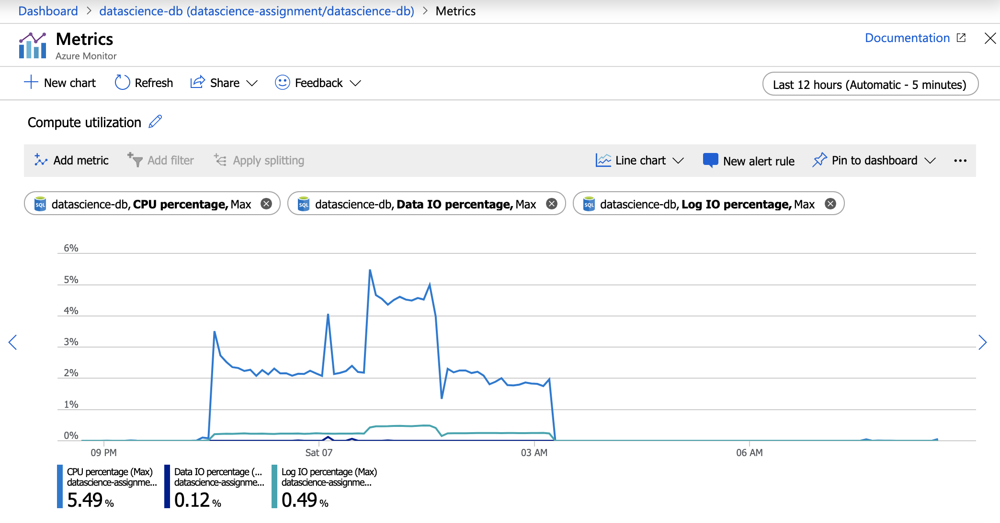

In [56]:
# Check if data of the new table can be accessed:
with engine.connect() as conn, conn.begin():
    data = pd.read_sql_table('t_location', conn)

In [57]:
data.head()

,plz,#loc_id,lon,lat,Ort,einwohner,Bundesland
0,70435,9703,9.159157,48.830653,Stuttgart,206.0,Baden-Württemberg
1,66954,9414,7.564295,49.202121,Pirmasens,10417.0,Rheinland-Pfalz
2,90480,11724,11.132551,49.447293,Nürnberg,18393.0,Bayern
3,91074,11774,10.878277,49.572095,Herzogenaurach,22222.0,Bayern
4,60437,9033,8.678966,50.199217,Frankfurt am Main,3123.0,Hessen


Abschließende Abbildung veranschaulicht die Data Preparation:

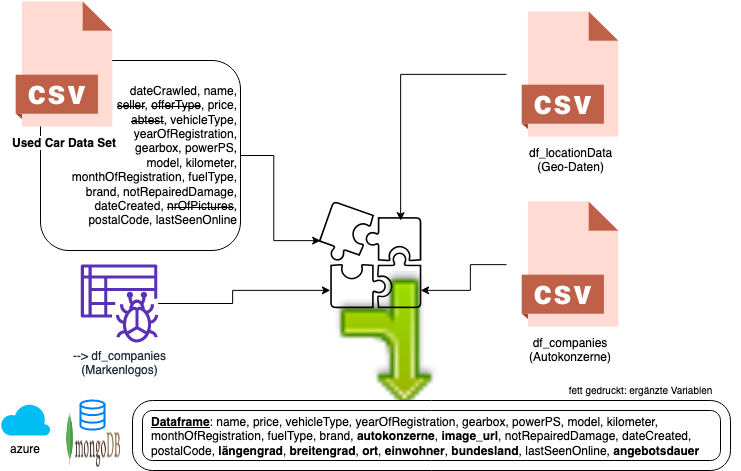

## Analyse des Marktes

In diesem Abschnitt wird eine deskriptive statistische Anaylse durchgeführt.



### Marktcharakteristika

Zunächst werden die Marktcharakteristika berechnet und visualisiert.

#### Welche Automobil-Marken gibt es im Gebrauchtwagenmarkt?

(Verteilung bei normalen Fahrzeugen und Oldtimern)

Nachfolgend werden die zwei Dataframes mit der value.counts und print Funktion ausgegeben.

In [58]:
print('Normale Fahrzeuge:')
print()
print(df_normalCars['brand'].value_counts().head(10))
print('-----------------')
print()
print('Oldtimer:')
print()
print(df_oldtimerCars['brand'].value_counts().head(10))

Normale Fahrzeuge:

volkswagen       68247
bmw              36199
opel             34113
mercedes_benz    31282
audi             29690
ford             22087
renault          15362
peugeot          9970 
fiat             8172 
seat             6156 
Name: brand, dtype: int64
-----------------

Oldtimer:

volkswagen        1187
mercedes_benz     1041
sonstige_autos    835 
opel              471 
ford              417 
bmw               278 
porsche           243 
fiat              240 
trabant           178 
chevrolet         174 
Name: brand, dtype: int64


Ergebnisse:
- Volkswagen ist in beiden Dfs die Marke mit den meisten PKW im Markt.
- Die Häufigkeiten und die Häufigkeitsverteilung der Marken unterscheidet sich deutlich zwischen den beiden DFs.

Die Visualisierung der Ergebnisse mit matplotlib als Bar-Chart erhält man mit dem folgdenden Code (zunächst normale PKW und dann Oldtimer):

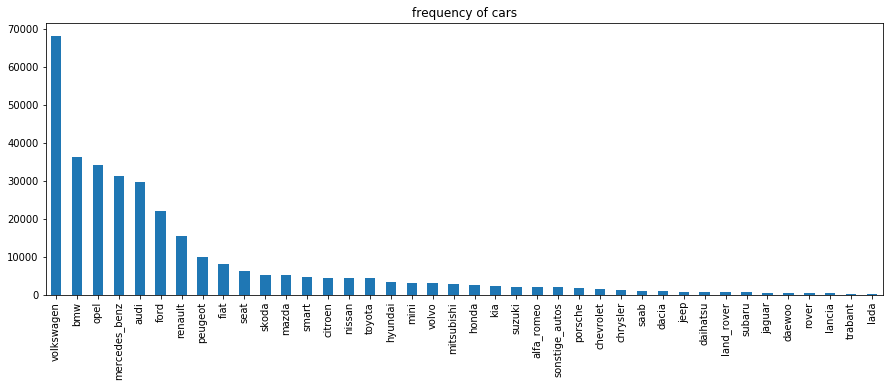

In [59]:
df_normalCars['brand'].value_counts().plot(
    kind="bar", figsize=(15, 5), title="frequency of cars")

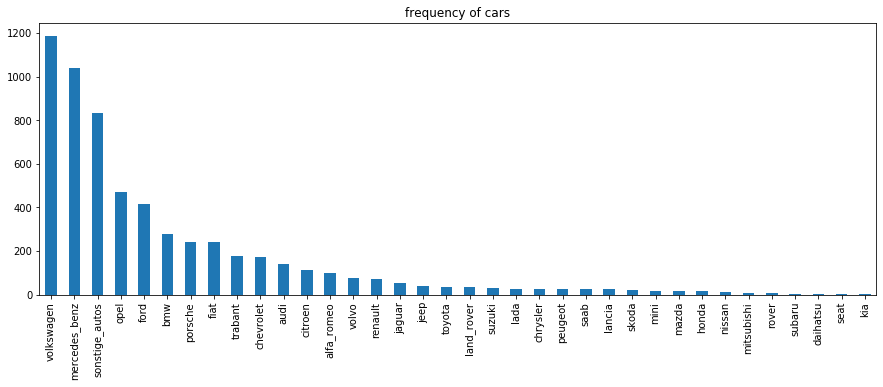

In [61]:
df_oldtimerCars['brand'].value_counts().plot(
    kind="bar", figsize=(15, 5), title="frequency of cars")

#### Wie stellt sich die Verteilung der Marktanteile in Bezug auf Marken und Automobilkonzerne dar?

Zunächst werden die Häufigkeiten und Marktanteile in Bezug auf Marken bei normalen PKW dargestellt:

Codebeschreibung:
1. Zählen der groupierten Variablen (Autos einer Marke).
2. Erstellen einer Pivottabelle mit pd.concat
3. Summieren der gesamten Counts und Formel zur Berechnung des Anteils einer Marke.

In [62]:
df_normalCarsCount = np.round(df_normalCars.groupby(
    ['company', "brand"])["name"].count())

df_normalCarsPivot = pd.concat([df_normalCarsCount], axis=1)
df_normalCarsPivot.columns = ['Count']
df_normalCarsPivot['Count'].value_counts
Total = df_normalCarsPivot['Count'].sum()
df_normalCarsPivot['Anteil'] = df_normalCarsPivot['Count'] / Total * 100
df_normalCarsPivot

Count     Anteil
company                     brand                          
Aufgelöste-Konzerne         saab           480    0.149020 
                            trabant        269    0.083513 
BMW-Konzern                 bmw            36199  11.238261
                            mini           3173   0.985083 
Daimler-Konzern             mercedes_benz  31282  9.711740 
                            smart          4761   1.478089 
Fiat-Chrysler-Konzern       alfa_romeo     1963   0.609429 
                            chrysler       1238   0.384347 
                            fiat           8172   2.537061 
                            jeep           699    0.217010 
                            lancia         395    0.122631 
Ford-Konzern                ford           22087  6.857081 
Geely-Konzern               volvo          2971   0.922370 
General Motors-Konzern      chevrolet      1505   0.467239 
                            daewoo         471    0.146226 
                            saab           480    0.149020 
Honda-Konzern               honda          2453   0.761553 
Hyundai-Konzern             hyundai        3340   1.036929 
                            kia            2309   0.716847 
Mazda-Konzern               mazda          5082   1.577746 
PSA Peugeot Citroen-Konzern citroen        4512   1.400785 
                            peugeot        9970   3.095264 
Renault-Nissan-Gruppe       dacia          843    0.261716 
                            lada           167    0.051846 
                            mitsubishi     2698   0.837615 
                            nissan         4502   1.397681 
                            opel           34113  10.590646
                            renault        15362  4.769252 
Subaru-Konzern              subaru         686    0.212974 
Suzuki-Konzern              suzuki         2066   0.641406 
Tata Motors-Konzern         jaguar         529    0.164232 
                            land_rover     694    0.215458 
                            rover          396    0.122941 
Toyota-Konzern              daihatsu       696    0.216079 
                            toyota         4337   1.346455 
VW-Konzern                  audi           29690  9.217491 
                            porsche        1826   0.566896 
                            seat           6156   1.911178 
                            skoda          5286   1.641080 
                            volkswagen     68247  21.187811

Visualisierung der Ergebnisse mit matplotlib als Bar-Chart.

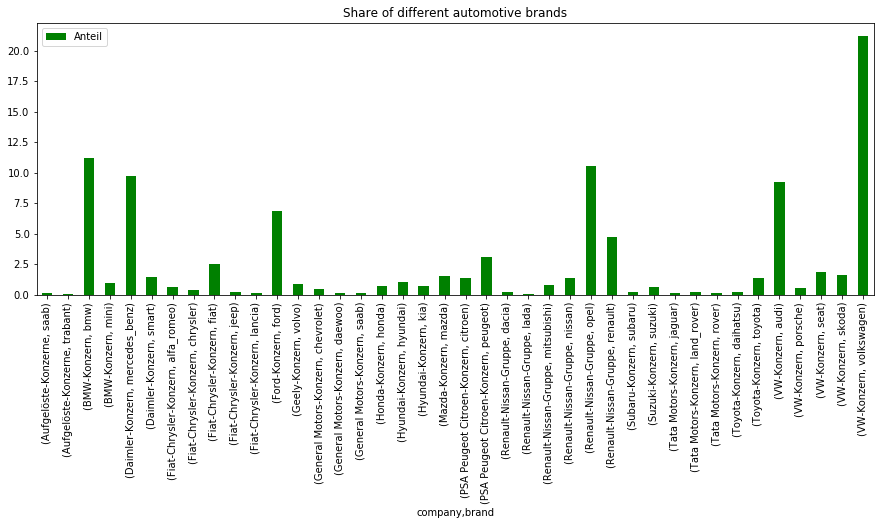

In [63]:
df_normalCarsPivot[["Anteil"]].plot(kind="bar",stacked=True, figsize=(15,5),color=["g"],title="Share of different automotive brands")

Im Anschluss werden die Häufigkeiten und Marktanteile in Bezug auf Marken bei Oldtimern dargestellt:

In [69]:
df_oldtimerCarsCount = np.round(
    df_oldtimerCars.groupby(['company', "brand"])["name"].count())

df_oldtimerCarsPivot = pd.concat([df_oldtimerCarsCount], axis=1)
df_oldtimerCarsPivot.columns = ['Count']
df_oldtimerCarsPivot['Count'].value_counts
Total2 = df_oldtimerCarsPivot['Count'].sum()
df_oldtimerCarsPivot['Anteil'] = df_oldtimerCarsPivot['Count'] / Total2 * 100
df_oldtimerCarsPivot

Count     Anteil
company                     brand                          
Aufgelöste-Konzerne         saab           13     0.251889 
                            trabant        178    3.448944 
BMW-Konzern                 bmw            278    5.386553 
                            mini           17     0.329394 
Daimler-Konzern             mercedes_benz  1041   20.170510
Fiat-Chrysler-Konzern       alfa_romeo     99     1.918233 
                            chrysler       26     0.503778 
                            fiat           240    4.650262 
                            jeep           39     0.755668 
                            lancia         25     0.484402 
Ford-Konzern                ford           417    8.079829 
Geely-Konzern               volvo          77     1.491959 
General Motors-Konzern      chevrolet      174    3.371440 
                            saab           13     0.251889 
Honda-Konzern               honda          15     0.290641 
Hyundai-Konzern             kia            1      0.019376 
Mazda-Konzern               mazda          17     0.329394 
PSA Peugeot Citroen-Konzern citroen        112    2.170122 
                            peugeot        26     0.503778 
Renault-Nissan-Gruppe       lada           28     0.542531 
                            mitsubishi     8      0.155009 
                            nissan         12     0.232513 
                            opel           471    9.126138 
                            renault        74     1.433831 
Subaru-Konzern              subaru         4      0.077504 
Suzuki-Konzern              suzuki         32     0.620035 
Tata Motors-Konzern         jaguar         54     1.046309 
                            land_rover     35     0.678163 
                            rover          7      0.135633 
Toyota-Konzern              daihatsu       1      0.019376 
                            toyota         35     0.678163 
VW-Konzern                  audi           139    2.693276 
                            porsche        243    4.708390 
                            seat           1      0.019376 
                            skoda          22     0.426274 
                            volkswagen     1187   22.999419

Visualisierung der Ergebnisse mit matplotlib als Bar-Chart.

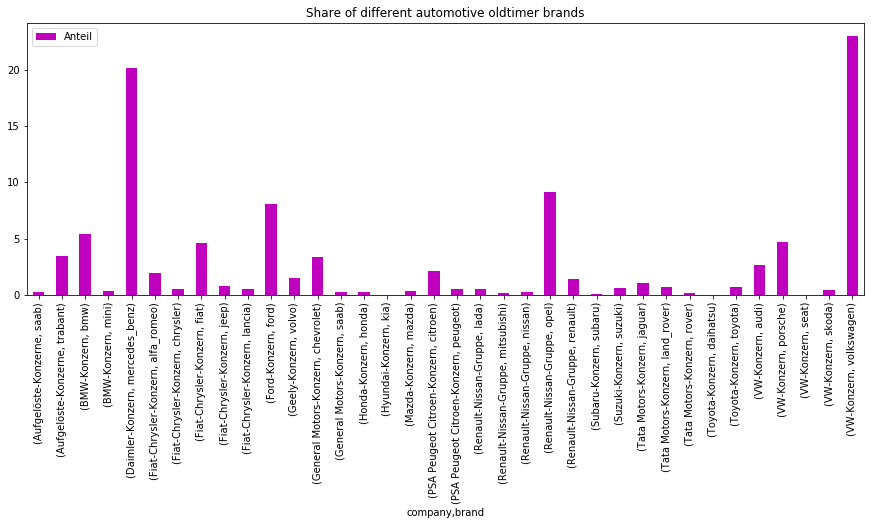

In [70]:
df_oldtimerCarsPivot[["Anteil"]].plot(kind="bar", stacked=True, figsize=(
    15, 5), color=["m"], title="Share of different automotive oldtimer brands")

__Relative Häufigkeiten normale PKW in Bezug auf Automobil-Konzernen:__

In [72]:
df_normalCarsKonzernCount = np.round(
    df_normalCars.groupby(['company', ])["name"].count())

df_normalCarsKonzernPivot = pd.concat([df_normalCarsKonzernCount], axis=1)
df_normalCarsKonzernPivot.columns = ['Count']
df_normalCarsKonzernPivot['Count'].value_counts
Total = df_normalCarsKonzernPivot['Count'].sum()
df_normalCarsKonzernPivot['Anteil'] = df_normalCarsKonzernPivot['Count'] / Total * 100
df_normalCarsKonzernPivot

,Count,Anteil
company,,
Aufgelöste-Konzerne,749,0.232533
BMW-Konzern,39372,12.223343
Daimler-Konzern,36043,11.189829
Fiat-Chrysler-Konzern,12467,3.870477
Ford-Konzern,22087,6.857081
Geely-Konzern,2971,0.922370
General Motors-Konzern,2456,0.762484
Honda-Konzern,2453,0.761553
Hyundai-Konzern,5649,1.753776


__Relative Häufigkeiten bei Oldtimern in Bezug auf Automobil-Konzerne:__

In [67]:
df_oldtimerCarsKonzernCount = np.round(
    df_oldtimerCars.groupby(['company', ])["name"].count())
#df_normalCarsRelCount = np.percentile(df_normalCarsCount)

df_oldtimerCarsKonzernPivot = pd.concat([df_oldtimerCarsKonzernCount], axis=1)
df_oldtimerCarsKonzernPivot.columns = ['Count']
df_oldtimerCarsKonzernPivot['Count'].value_counts
Total = df_oldtimerCarsKonzernPivot['Count'].sum()
df_oldtimerCarsKonzernPivot['Anteil'] = df_oldtimerCarsKonzernPivot['Count'] / Total * 100
df_oldtimerCarsKonzernPivot

,Count,Anteil
company,,
Aufgelöste-Konzerne,191,3.700833
BMW-Konzern,295,5.715947
Daimler-Konzern,1041,20.170510
Fiat-Chrysler-Konzern,429,8.312343
Ford-Konzern,417,8.079829
Geely-Konzern,77,1.491959
General Motors-Konzern,187,3.623329
Honda-Konzern,15,0.290641
Hyundai-Konzern,1,0.019376


### Preisstatistiken

__Alle Marken/normale Autos:__ Was ist der minimale Preis, was der maximale Preis einer Marke? Wo liegt das arithmetische Mittel und der Median?

Codebeschreibung:
1. Ausrechnen von min, max, mean, median (jeweils als DF) und Abspeichern als DF (df_StatsPriceNormalCars)
2. Tabelle mit Spalten anlegen

In [68]:
df_normalCarsMin = df_normalCars.groupby(by="brand")["price"].min()
df_normalCarsMax = df_normalCars.groupby(by="brand")["price"].max()
df_normalCarsMean = np.round(df_normalCars.groupby(by="brand")["price"].mean())
df_normalCarsMedian = np.round(
    df_normalCars.groupby(by="brand")["price"].median())

df_StatsPriceNormalCars = pd.concat(
    [df_normalCarsMin, df_normalCarsMax, df_normalCarsMean, df_normalCarsMedian], axis=1)
df_StatsPriceNormalCars.columns = ['Min', 'Max', 'Mean', 'Median']

df_StatsPriceNormalCars

,Min,Max,Mean,Median
brand,,,,
alfa_romeo,100,55800,3848.0,2450.0
audi,100,323223,9274.0,6400.0
bmw,100,390000,8616.0,6000.0
chevrolet,225,59999,6229.0,4099.0
chrysler,100,34900,4063.0,2450.0
citroen,100,38888,3661.0,2550.0
dacia,500,19990,5946.0,4950.0
daewoo,100,3850,1071.0,1000.0
daihatsu,100,12850,1853.0,1099.0


Visualiserung mittels line chart:

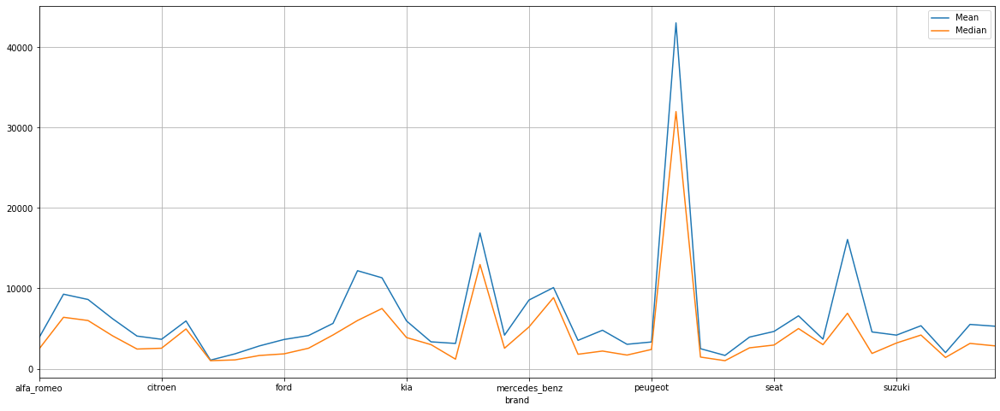

In [69]:
from matplotlib import pyplot as plt
%matplotlib inline
df_StatsPriceNormalCars[["Mean", "Median"]].plot(figsize=(20, 8), grid=True)
plt.show()

Mittelwert und Median unterscheiden sich. Die Verteilung ist links-schief. Dies ist ein Indiz, dass die Preise nicht normalverteilt sind.

### Kilometerstatistiken

__Alle Marken/normale Autos:__ Was sind die minimalen Kilometer eines Fahrzeugs, was die maximalen bei einer Marke? Wo liegt das arithmetische Mittel und der Median?

In [70]:
df_normalCarsKilMin = df_normalCars.groupby(by="brand")["kilometer"].min()
df_normalCarsKilMax = df_normalCars.groupby(by="brand")["kilometer"].max()
df_normalCarsKilMean = np.round(
    df_normalCars.groupby(by="brand")["kilometer"].mean())
df_normalCarsKilMedian = np.round(
    df_normalCars.groupby(by="brand")["kilometer"].median())

df_StatsKilometerPriceNormalCars = pd.concat(
    [df_normalCarsKilMin, df_normalCarsKilMax, df_normalCarsKilMean, df_normalCarsKilMedian], axis=1)
df_StatsKilometerPriceNormalCars.columns = ['Min', 'Max', 'Mean', 'Median']

df_StatsKilometerPriceNormalCars

,Min,Max,Mean,Median
brand,,,,
alfa_romeo,5000,150000,131083.0,150000
audi,5000,150000,129360.0,150000
bmw,5000,150000,132991.0,150000
chevrolet,5000,150000,101542.0,100000
chrysler,5000,150000,135238.0,150000
citroen,5000,150000,121303.0,150000
dacia,5000,150000,86026.0,80000
daewoo,5000,150000,123832.0,125000
daihatsu,5000,150000,118973.0,125000


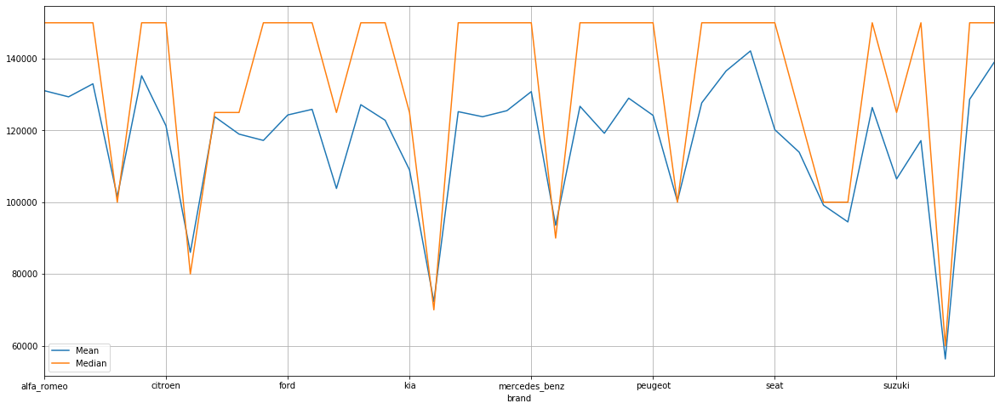

In [71]:
from matplotlib import pyplot as plt
%matplotlib inline
df_StatsKilometerPriceNormalCars[["Mean", "Median"]].plot(
    figsize=(20, 8), grid=True)
plt.show()

Aufgrund der Residualgröße 150.000 Kilometer und mehr, die auch gleichzeitig die größte Merkmalsausprägung bei Kilometern ist, liegt der arithmetische Mittelwert in der Regel unter dem Mittelwert. Die Verteilung nach Kilometern ist nicht normalverteilt und rechts-lastig. Bei eine Regression könnte diese Ausprägung ausgeklammert werden, um einen besseren Datensatz zu erhalten.

### Korrelationen - welche Variablen haben einen Einfluss auf den Preis?

Die sicherlich interessanteste Frage, die es zu beantworten gilt, ist, welche Attribute des Datensatzes wirken sich auf den Angebotspreis aus? Diese Frage kann mit einer Korrelationsanalyse durchgeführt werden. In dieser Arbeit wird eine Korrelation nach Pearson berechnet. Im erzeugten DF gibt es vier metrische Variablen, die auf den Preis eine Wirkung haben könnten (alle anderen müssen in diesem ersten Schritt aus der Betrachtung herausgenommen werden): kilometer, yearOfRegistration, powerPS

Die Korrelationsmatrix wird durch den nachfolgenden Programmcode ausgeführt und hat folgendes Ergebnis:
- Kilometer haben einen mittleren negativen Einfluss auf den Preis.
- Je jünger das Zulassungsjahr, desto höher der Preis. Dieser Zusammenhang befindet sich ebenfalls auf einem mittleren Niveau.
- Die höher der PS hat einen schwach positiven Zusammenhang mit dem Angebotspreis.

__Normale PKW:__

Funktion zum Ausrechnen Korrelationen mit metrischer Variablen:

In [72]:
df_corrNormalCars = df_normalCars[[
    'price', 'kilometer', 'yearOfRegistration', 'powerPS']]
df_corrNormalCars = df_corrNormalCars.corr(method='pearson')
df_corrNormalCars

,price,kilometer,yearOfRegistration,powerPS
price,1.000000,-0.402715,0.505184,0.201101
kilometer,-0.402715,1.000000,-0.463694,-0.020520
yearOfRegistration,0.505184,-0.463694,1.000000,0.092084
powerPS,0.201101,-0.020520,0.092084,1.000000


Mit diesen Variablen kann nun eine Regressionsanalyse durchgeführt werden. Fraglich ist, ob gut diese Variablen den Abgebotspreis erklären werden. Um die Güte einer Regression zu erhöhen, sollte überlegt werden, weitere Variablen in die Korrelationsanalyse aufzunehmen. Dies ist möglich, in dem kategoriale oder ordinal-skalierte Variabelen in Dummy-Variablen umgerechnet werden. In diesem Datensatz können die nominalskalierten Variablen gearbox, fuelType, model, brand, vehicleType in Dummy-Variablen umgerechnet werden:

__Einsatz von Dummy-Variablen bei normalen PKW:__

In [73]:
trainDfDummiesNormalCars = pd.get_dummies(
    df_normalCars, columns=['gearbox', 'fuelType', 'model', 'brand', 'vehicleType'])
trainDfDummiesNormalCars.head(5)

,name,price,yearOfRegistration,powerPS,kilometer,monthOfRegistration,notRepairedDamage,dateCreated,plz,lastSeen,...,brand_volvo,vehicleType_-,vehicleType_andere,vehicleType_bus,vehicleType_cabrio,vehicleType_coupe,vehicleType_kleinwagen,vehicleType_kombi,vehicleType_limousine,vehicleType_suv
0,golf_3_1.6,480,1993,0,150000,0,-,2016-03-24,70435,2016-04-07,...,0,1,0,0,0,0,0,0,0,0
1,a5_sportback_2.7_tdi,18300,2011,190,125000,5,ja,2016-03-24,66954,2016-04-07,...,0,0,0,0,0,1,0,0,0,0
2,"jeep_grand_cherokee_""overland""",9800,2004,163,125000,8,-,2016-03-14,90480,2016-04-05,...,0,0,0,0,0,0,0,0,0,1
3,golf_4_1_4__3türer,1500,2001,75,150000,6,nein,2016-03-17,91074,2016-03-17,...,0,0,0,0,0,0,1,0,0,0
4,skoda_fabia_1.4_tdi_pd_classic,3600,2008,69,90000,7,nein,2016-03-31,60437,2016-04-06,...,0,0,0,0,0,0,1,0,0,0


Mit diesen Dummy-Variablen kann eine größere Korrelationsmatrix gerechnet werden. Zur besseren Veranschaulichung werden hier nur gearbox und fuelType in die Berechnung einbezogen.

__Korrelationen mit ausgewählten Dummy-Variablen bei normalen PKW__

In [73]:
df_corrNormalCars2 = trainDfDummiesNormalCars[['price', 'kilometer', 'yearOfRegistration',
                                               'powerPS', 'gearbox_automatik', 'gearbox_manuell', 'fuelType_benzin', 'fuelType_diesel']]

df_corrNormalCars2 = df_corrNormalCars2.corr(method='pearson')
df_corrNormalCars2

,price,kilometer,yearOfRegistration,powerPS,gearbox_automatik,gearbox_manuell,fuelType_benzin,fuelType_diesel
price,1.000000,-0.402715,0.505184,0.201101,0.287056,-0.247274,-0.155380,0.206334
kilometer,-0.402715,1.000000,-0.463694,-0.020520,-0.046739,0.044119,-0.111028,0.093881
yearOfRegistration,0.505184,-0.463694,1.000000,0.092084,0.140035,-0.112098,-0.256414,0.330529
powerPS,0.201101,-0.020520,0.092084,1.000000,0.157453,-0.113356,-0.040830,0.059864
gearbox_automatik,0.287056,-0.046739,0.140035,0.157453,1.000000,-0.902996,-0.143776,0.161869
gearbox_manuell,-0.247274,0.044119,-0.112098,-0.113356,-0.902996,1.000000,0.171539,-0.141811
fuelType_benzin,-0.155380,-0.111028,-0.256414,-0.040830,-0.143776,0.171539,1.000000,-0.850659
fuelType_diesel,0.206334,0.093881,0.330529,0.059864,0.161869,-0.141811,-0.850659,1.000000


Die Korrelationsmatrix hat folgendes Ergebnis:

- Kilometer haben weiterhin einen mittleren negativen Einfluss auf den Preis.
- Je jünger das Zulassungsjahr, desto höher der Preis. Dieser Zusammenhang befindet sich ebenfalls auf einem mittleren Niveau.
- Die höher der PS hat einen schwach positiven Zusammenhang mit dem Angebotspreis.

Neu:
- Automatikgetriebe haben einen schwach-positiven Einfluss.
- Manuelle Getriebe haben einen schwach-negativen Einfluss.
- Benzinmotoren wirken sich schwach-negativ auf den Preis aus.
- Dieselmotoren wirken sich schwach-positiv auf den Preis aus.

__Weitere Korrelationsanalysen bei Oldtimer möglich__


In [75]:
df_corrOldtimerCars = df_oldtimerCars[[
    'price', 'kilometer', 'yearOfRegistration', 'powerPS']]
df_corrOldtimerCars = df_corrOldtimerCars.corr(method='pearson')
df_corrOldtimerCars

,price,kilometer,yearOfRegistration,powerPS
price,1.000000,-0.093835,-0.228277,0.100142
kilometer,-0.093835,1.000000,0.264862,0.050326
yearOfRegistration,-0.228277,0.264862,1.000000,0.004680
powerPS,0.100142,0.050326,0.004680,1.000000


In [66]:
trainDfDummiesOldtimerCars = pd.get_dummies(df_oldtimerCars, columns=['gearbox', 'fuelType','model', 'brand', 'vehicleType'])
trainDfDummiesOldtimerCars.head(5)

,name,price,yearOfRegistration,powerPS,kilometer,monthOfRegistration,notRepairedDamage,dateCreated,plz,lastSeen,...,brand_volvo,vehicleType_-,vehicleType_andere,vehicleType_bus,vehicleType_cabrio,vehicleType_coupe,vehicleType_kleinwagen,vehicleType_kombi,vehicleType_limousine,vehicleType_suv
23,volkswagen_t3_andere,1990,1981,50,5000,1,nein,2016-03-09,87471,2016-03-10,...,0,0,0,1,0,0,0,0,0,0
31,mercedes_camper_d407,1500,1984,70,150000,8,nein,2016-03-25,22767,2016-03-27,...,0,0,0,1,0,0,0,0,0,0
76,senator_a2__3_0e__180ps__cd_ausstattung.,1222,1984,180,150000,3,-,2016-04-02,57290,2016-04-06,...,0,0,0,0,0,0,0,0,1,0
130,audi_100_c3_typ_44_bj_1985_quattro_krarosse_mit_achsen,150,1985,0,150000,4,-,2016-03-06,87616,2016-04-07,...,0,1,0,0,0,0,0,0,0,0
167,ford_mustang_v8_390cui,25000,1968,305,90000,11,nein,2016-03-31,74547,2016-04-06,...,0,0,0,0,0,1,0,0,0,0


In [67]:
df_corrOldtimerCars2 = trainDfDummiesOldtimerCars [['price','kilometer','yearOfRegistration','powerPS','gearbox_automatik','gearbox_manuell', 'fuelType_benzin', 'fuelType_diesel']]
#del df_corr2['monthOfRegistration']
df_corrOldtimerCars2 = df_corrOldtimerCars2.corr(method='pearson')
#df_corrNormalCars2['price']
df_corrOldtimerCars2

,price,kilometer,yearOfRegistration,powerPS,gearbox_automatik,gearbox_manuell,fuelType_benzin,fuelType_diesel
price,1.000000,-0.093835,-0.228277,0.100142,0.041851,0.002507,0.097098,-0.068573
kilometer,-0.093835,1.000000,0.264862,0.050326,0.131261,-0.024568,0.003112,0.109584
yearOfRegistration,-0.228277,0.264862,1.000000,0.004680,0.048473,0.015021,-0.055977,0.137195
powerPS,0.100142,0.050326,0.004680,1.000000,0.179076,-0.061316,0.116374,-0.030390
gearbox_automatik,0.041851,0.131261,0.048473,0.179076,1.000000,-0.712411,0.147341,-0.058857
gearbox_manuell,0.002507,-0.024568,0.015021,-0.061316,-0.712411,1.000000,0.221331,0.099618
fuelType_benzin,0.097098,0.003112,-0.055977,0.116374,0.147341,0.221331,1.000000,-0.488406
fuelType_diesel,-0.068573,0.109584,0.137195,-0.030390,-0.058857,0.099618,-0.488406,1.000000


In [ ]:
Hier noch abschließende Beschreibung Korrelationen und Ausblick einfügen.

### Ladas in Deutschland

Zum Abschluss möchten wir uns noch die verfügbaren Ladas in Deutschland ansehen. Diese werden wir anschließend in einer Map darstellen. 

Nachdem diese Darstellung nicht mit dem Plugin 'gmplot' implementiert werden konnte, haben wir uns für die bessere Alternative 'folium' entschieden.

Für die Implementierung wurden unter anderem die folgenden Artikel zu Hilfe gezogen: 
- https://towardsdatascience.com/data-visualization-with-python-folium-maps-a74231de9ef7

Im nachfolgenden Code-Chunk wird 'folium' installiert bzw. implementiert.

In [49]:
#!pip install folium
import folium 
import webbrowser

Zunächst werden hierfür aus dem aufbereiteten ''df_usedCarsAnalysis' lediglich alle Ladas extrahiert und in einem neuen Pandas Dataframe gespeichert.

In [52]:
df_ladas = df_usedCarsAnalysis[(df_usedCarsAnalysis.brand == 'lada')]
df_ladas = df_ladas.reset_index()

In [58]:
#df_ladas['price_q'] = pd.cut(df_ladas['price'], 3).value_counts()
#df_ladas['price_q']

Die Kreise, welche später als Markierung in der Map dienen, sollen in drei unterschiedlichen Größen gezeichnet werden. Hierzu ist es notwendig, eine neue Spalte in 'df_ladas' anzulegen, in welcher die enthaltenen Preise in drei verschiedene Kategorien geclustert werden.

Danach erfolgt mittels der 'replace'-Funktion das Ersetzen der zuvor erstellten Kategorien. Aus den Kategorien 0-2 werden die Kategorien 1-3, um diese später zur Multiplikation zur Festlegung des Kreisdurchmessers verwenden zu können. 

- Kategorie 1: 198.99 - 2.000  Euro
- Kategorie 1: 2.000  - 3.666  Euro
- Kategorie 1: 3.666  - 12.000 Euro

In [65]:
df_ladas['price_q'] = pd.qcut(df_ladas['price'], 3, labels=False)

df_ladas.replace({0: 1, 1: 2, 2: 3}, inplace=True)

pd.qcut(df_ladas['price'], 3).value_counts()

(198.999, 2000.0]    66
(3666.0, 12000.0]    64
(2000.0, 3666.0]     63
Name: price, dtype: int64

Im Anschluss daran wird die Map initialisiert mit der Latitude und Longitude des Ladas in der ersten Zeile des Dataframes. 

Zusätzlich wird eine Funktion implementiert, welche in der Lage ist, die normalen Autos von den Oldtimern farblich zu unterscheiden 

In [71]:
lada_map = folium.Map(location=[df_ladas['lat'].iloc[0], df_ladas['lon'].iloc[0]], zoom_start=6)

def findColor(year):
    if year <= 1986:
        return 'red'
    elif year > 1986: 
        return 'green'
    

Für die Fertigstellung der Map ist es notwendig, mittels einer for-Schleife die Lokationen der Ladas zu setzen.
Darüber hinaus wird mit mit der Variable 'radius' die Größe des Kreises festgelegt, währrendessen die Variable 'popup' die wichtigsten Informationen beim Klick auf den Kreis anzeigen kann und 'fill_color' die Funktion aufruft, welche bestimmt ob es sich um einen Oldtimer oder ein normaler Auto handelt.

In [73]:
for lat, lon, price, name, year, km, price_q in zip(df_ladas['lat'], df_ladas['lon'], df_ladas['price'], df_ladas['name'], df_ladas['yearOfRegistration'], df_ladas['kilometer'], df_ladas['price_q']):
    folium.CircleMarker(
        [lat, lon],
        radius=2.5*price_q,
        popup = ('Name: ' + str(name).capitalize() + '<br>'
                 'Erstzulassung: ' + str(year) + '<br>'
                 'Kilometer: ' + str(km) + '<br>'
                 'Preis: ' + str(price) + ' €'
                ),
        color='b',
        #fill_color=signDict[price_q],
        fill_color=findColor(year),
        fill=True,
        fill_opacity=0.7
        ).add_to(lada_map)

lada_map

In [171]:
df_usedCarsAnalysis.month_crawled.unique()

array([3, 4])

In [80]:
def generateBaseMap(default_location=[51.1642292, 10.4541194], default_zoom_start=6):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [87]:
from folium.plugins import HeatMap
df_copy = df_usedCarsAnalysis.copy()
df_copy['count'] = 1
base_map = generateBaseMap()
HeatMap(data=df_copy[['lat', 'lon', 'count']].groupby(['lat', 'lon']).sum().reset_index().values.tolist(), radius=8, max_zoom=13).add_to(base_map)
base_map

In [92]:
df_copy.yearOfRegistration.sort_values().unique()

array([1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955,
       1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966,
       1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977,
       1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988,
       1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999,
       2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015])

In [195]:
df_year_list = []
for year in df_copy.yearOfRegistration.sort_values().unique():
    df_year_list.append(df_copy.loc[df_copy.yearOfRegistration == year, ['yearOfRegistration', 'lat', 'lon', 'count']].groupby(['lat', 'lon']).sum().reset_index().values.tolist())


In [204]:
df_year_list

[[[49.4581144599882, 11.098875559782, 1945.0, 1.0],
  [50.9560547323864, 7.01388384647454, 1945.0, 1.0],
  [50.9731810927458, 7.19570872988654, 1945.0, 1.0],
  [51.3391582886575, 7.42396377544111, 1945.0, 1.0]],
 [[49.2469133014054, 7.06640750316624, 1946.0, 1.0],
  [52.0639128917824, 10.309836276937, 1946.0, 1.0]],
 [[47.786684445993096, 12.4555969715455, 1947.0, 1.0],
  [49.869789038848296, 8.94383082586019, 1947.0, 1.0],
  [50.376591827464196, 8.01293696339706, 1947.0, 1.0],
  [50.864409442036894, 6.10016457304199, 1947.0, 1.0],
  [53.2711215925841, 10.9621016305795, 1947.0, 1.0]],
 [[47.70143408268311, 9.287036894686901, 1948.0, 1.0],
  [51.7506489157148, 6.310189073001539, 1948.0, 1.0],
  [54.4048745029204, 9.61055277087657, 1948.0, 1.0]],
 [[47.5801050205365, 9.63993853240149, 1949.0, 1.0],
  [53.040594453343495, 8.84826849799593, 1949.0, 1.0],
  [53.1237889078251, 7.546733779155691, 1949.0, 1.0]],
 [[47.938854570195296, 7.82962231016281, 1950.0, 1.0],
  [47.99593742100411, 7.850

In [231]:
list_time = df_copy.yearOfRegistration.sort_values().unique()
list_time

array([1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955,
       1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966,
       1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977,
       1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988,
       1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999,
       2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015])

In [253]:
time_index = [(1945+x)  for x in range(len(df_year_list))]

In [254]:
from folium.plugins import HeatMapWithTime
base_map = generateBaseMap(default_zoom_start=6)
HeatMapWithTime(df_year_list, 
                radius=5, 
                index=time_index,
                gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'}, 
                min_opacity=0.5, max_opacity=0.8, 
                use_local_extrema=True).add_to(base_map)
base_map.save('allCars_years.html')

## Fazit


Wir haben eine Analyse des privaten Gebrauchtwagenmarktes für KFZ in Deutschland durchgeführt und dabei die verschiedenen Elemente aus den Assignments des Kurses in Python eingesetzt/umgesetzt.

Zunächst haben wir einen geeingneten Datensatz gesucht und uns dann mit den Themen Erweiterung des Datensatzes und Datenaufbereitung, Verwendung einer Datenbank und zielgerichtete Analyse auseinandergesetzt.

Folgende Meilensteine konnten in Python erreicht werden:

    Datenaufbereitung
    Einbinden von CSVs und Crawling-Ergebnissen
    Einbinden von Microsoft SQL in der Azure Cloud
    Erfolgreiche Verbindung zu Azure Cosmos DB (Mongo DB Api)


Deskriptive Statistik:

    Häufigkeiten/relative Häufigkeiten
    Visualisierungen
    Korrelationen
    Gmplott Marker
    Multiindexing

Die Einarbeitung in Python hat dabei gut geklappt. Python ist eine schnell lernbare, intuitive Programmiersprache. Das Arbeiten in dem Projekt mit Python hat Spaß gemacht.

Weitere Ideen (Induktive Statistik - Stoff über das Assignment hinaus):

    Prediction von Angebotspreisen
    Berechnung des Wertverfalls
    Suchen des günstigsten Angebots
    Vorbereitung und Durchführen einer Regression
   





